<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [9]</a>'.</span>

# Imports

In [1]:
from shared import *
from itertools import chain

# Parameters

In [2]:
# Parameters
kp_param = -1.5e-6
ki_param = 0


In [3]:
error_term = [
    lambda target, measured: target - measured,
    # lambda target, measured: (target - measured) / measured,
    # lambda target, measured: (target - measured) / target
]

In [4]:
integral_type = [options.IntegralType.LEAKY.value]

# Simulation Configuration

In [5]:
SIMULATION_TIMESTEPS = 24 * 30
MONTE_CARLO_RUNS = 4

In [6]:
shock_amplitudes = [0.1, 0.5, 1.0]
sinusoid_amplitude = 0.5
sinusoid_frequency = 0.05

shocks = list(
    chain(
        *[
            [
                lambda timestep, shock_amplitude=shock_amplitude: shock_amplitude
                if timestep in [50, 100, 150, 200, 251, 301, 351, 401]
                else (
                    -shock_amplitude
                    if timestep in [51, 101, 151, 201, 250, 300, 350, 400]
                    else 0
                ),
                lambda timestep, shock_amplitude=shock_amplitude: shock_amplitude
                if timestep == 50
                else (-shock_amplitude if timestep == SIMULATION_TIMESTEPS / 2 else 0),
                lambda timestep, shock_amplitude=shock_amplitude: shock_amplitude
                / 50
                * np.sin(timestep * sinusoid_frequency)
                if timestep <= SIMULATION_TIMESTEPS / 2
                else 0,
            ]
            for shock_amplitude in shock_amplitudes
        ]
    )
) + [
    lambda timestep: sinusoid_amplitude / 50 * np.sin(timestep * sinusoid_frequency),
    lambda timestep: sinusoid_amplitude / 50 * np.sin(timestep * sinusoid_frequency),
    lambda timestep: sinusoid_amplitude / 50 * np.sin(timestep * sinusoid_frequency),
]

control_delays = [(lambda _timestep: 1200) for _ in range(len(shocks) - 3)] + [
    lambda timestep: 3600
    if timestep in chain(range(50, 100), range(300, 350))
    else 1200,
    lambda timestep: 3600 * 2
    if timestep in chain(range(50, 100), range(300, 350))
    else 1200,
    lambda timestep: 3600 * 3
    if timestep in chain(range(50, 100), range(300, 350))
    else 1200,
]

In [7]:

import numpy as np
from models.constants import SPY, RAY

halflife = SPY / 52 #weeklong halflife
# alpha = int(np.power(.5, float(1 / halflife)) * RAY)
alpha = 1000000000000000000000000000

In [8]:

# Update parameter options
update_params = {
    # By using an Enum, we can self-document all possible options
    options.DebtPriceSource.__name__: [options.DebtPriceSource.EXTERNAL.value],
    options.MarketPriceSource.__name__: [options.MarketPriceSource.DEFAULT.value],
    options.IntegralType.__name__: integral_type,
    "controller_enabled": [True],
    # A lambda that takes the timestep and returns the corresponding value
    "expected_control_delay": control_delays,
    "price_move": shocks,
    "kp": [kp_param],
    "ki": [lambda control_period=3600: ki_param / control_period],
    # Select or sweep the error term calculation, as a lambda
    # e.g. p*-p vs (p*-p)/p vs (p*-p)/p*
    "error_term": error_term,
    "alpha": [alpha]
}

update_initial_state = {
    'target_price': 1.0,
    'market_price': 1.0,
    'debt_price': 1.0,
}

"""
The ConfigWrapper allows you to pass a model as an argument, and update the simulation configuration.
Maps (params, states) would be merge updated, and all other options are overrides.
"""
system_simulation = ConfigWrapper(
    system_model, M=update_params, initial_state=update_initial_state, N=MONTE_CARLO_RUNS, T=range(SIMULATION_TIMESTEPS)
)

# Simulation Execution

<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [9]:
del configs[:]

system_simulation.append()

(data, tensor_field, sessions) = run(drop_midsteps=True)


                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 12
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (720, 23, 4, 15)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 7, 7, 7, 7, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 10, 10, 11, 11, 11, 11]
SubsetIDs: [0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5, 6, 6, 6, 6, 7, 7, 7, 7, 8, 8, 8, 8, 9, 9, 9, 9, 10, 10, 10, 10, 11, 11, 11, 11]
Ns       : [0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3, 0, 1, 2, 3]
ExpIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

# Data Analysis

In [10]:
df = data.copy()
df

,index,error_star,error_hat,old_error_star,old_error_hat,error_star_integral,error_hat_integral,error_star_derivative,error_hat_derivative,target_rate,...,market_price,debt_price,timedelta,timestamp,blockheight,simulation,subset,run,substep,timestep
0,0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,...,1.000000,1.000000,0,2018-12-18 00:00:00,0,0,0,1,0,0
1,6,0.002300,0.002300,0.0,0.0,6.175500,6.175500,4.283054e-07,4.283054e-07,-3.450000e-09,...,0.997700,1.000000,5370,2018-12-18 01:29:30,358,0,0,1,6,1
2,12,0.003440,0.003459,0.0,0.0,17.015077,17.226129,2.970321e-07,2.970321e-07,-5.160014e-09,...,0.996541,1.000000,3838,2018-12-18 02:33:28,613,0,0,1,6,2
3,18,0.004037,0.004076,0.0,0.0,31.206879,31.541036,1.571807e-07,1.571807e-07,-6.055944e-09,...,0.995924,1.000000,3800,2018-12-18 03:36:48,866,0,0,1,6,3
4,24,0.004360,0.004421,0.0,0.0,53.689763,54.500110,5.973424e-08,5.973424e-08,-6.540150e-09,...,0.995579,1.000000,5404,2018-12-18 05:06:52,1226,0,0,1,6,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34603,207383,0.013682,0.040075,0.0,0.0,-147556.592409,6419.065083,2.551020e-06,2.551020e-06,-2.052247e-08,...,1.219627,1.259702,4361,2019-02-08 00:02:49,299192,11,11,4,6,716
34604,207389,0.026568,0.043456,0.0,0.0,-147450.888367,6637.206267,2.467210e-06,2.467210e-06,-3.985182e-08,...,1.206630,1.250087,5223,2019-02-08 01:29:52,299540,11,11,4,6,717
34605,207395,0.039154,0.046559,0.0,0.0,-147267.686295,6886.908238,2.268665e-06,2.268665e-06,-5.873165e-08,...,1.193787,1.240346,5548,2019-02-08 03:02:20,299909,11,11,4,6,718
34606,207401,0.050765,0.048730,0.0,0.0,-147013.067502,7156.003423,2.055695e-06,2.055695e-06,-7.614751e-08,...,1.181775,1.230505,5648,2019-02-08 04:36:28,300285,11,11,4,6,719


In [11]:
kp = update_params["kp"][0]
ki = update_params["ki"][0](3600)

df = df.assign(**{'kp': kp, 'ki': ki})
df.to_parquet(f'exports/shock_datasets/kp_{kp}_ki_{ki}.parquet.gzip', compression='gzip')

In [12]:
df["target_rate_hourly"] = df.target_rate  # * 3600
df["error_star_derivative_scaled"] = df.error_star_derivative * 3600
df["error_hat_derivative_scaled"] = df.error_star_derivative * 3600

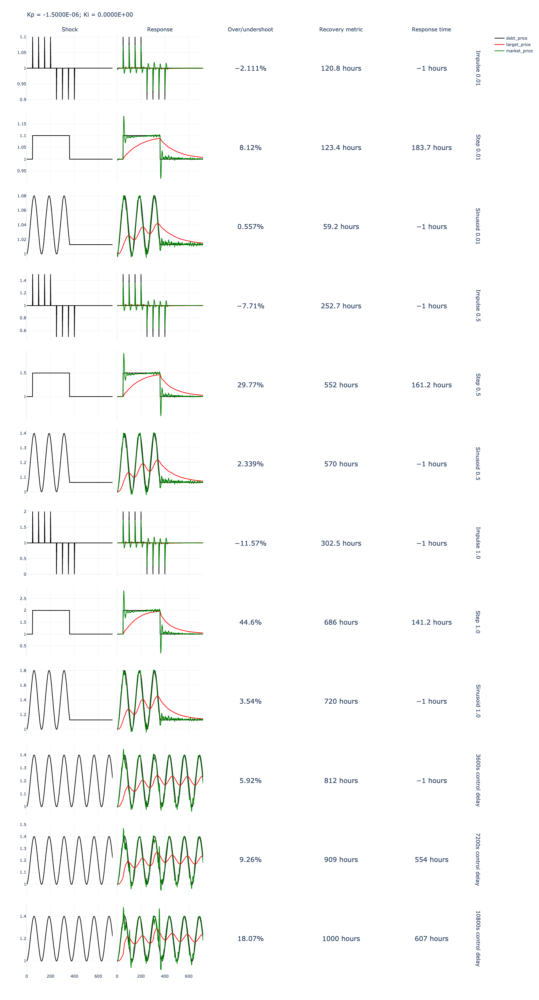

In [13]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

rows = len(shocks)

fig = make_subplots(
    rows=rows,
    cols=5,
    shared_xaxes=True,
    shared_yaxes="rows",
    horizontal_spacing=0.01,
    vertical_spacing=0.01,
    column_titles=[
        "Shock",
        "Response",
        "Over/undershoot",
        "Recovery metric",
        "Response time"
    ],
    row_titles=[
        "Impulse 0.01",
        "Step 0.01",
        "Sinusoid 0.01",
        "Impulse 0.5",
        "Step 0.5",
        "Sinusoid 0.5",
        "Impulse 1.0",
        "Step 1.0",
        "Sinusoid 1.0",
        "3600s control delay",
        "7200s control delay",
        "10800s control delay",
    ],
    specs=[
        [
            {"type": "xy"},
            {"type": "xy"},
            {"type": "indicator"},
            {"type": "indicator"},
            {"type": "indicator"},
        ]
        for _ in range(rows)
    ],
)

for subset in range(df.subset.max() + 1):
    dataset = df[df.subset == subset]

    dataset["relative_diff"] = df.market_price / df.debt_price
    
    overshoot_pct = (dataset.market_price.max() - dataset.debt_price.max()) / dataset.debt_price.max() * 100

    reasonable_steady_state_error = 0.01
    dataset["pct_error"] = dataset["error_hat"] / dataset["debt_price"]
    dataset["pct_error"] = dataset["pct_error"].abs()
    recovery_metric = (
        dataset[dataset.pct_error > reasonable_steady_state_error]
        .groupby(["run"])["timedelta"]
        .sum()
        .mean()
        / 3600
    )
    
    try:
        pv_initial = dataset['debt_price'].iloc[0]
        pv_max = dataset['debt_price'].max()

        target_initial = dataset[dataset.target_price > pv_initial].iloc[0]
        time_constant = dataset[dataset.target_price - pv_initial >= 0.63 * (pv_max - pv_initial)].iloc[0].timestamp - target_initial.timestamp
        time_constant = time_constant / pd.Timedelta(hours=1)
    except IndexError:
        time_constant = -1

    timesteps = dataset.timestep
    grouped = dataset.groupby("timestep", as_index=False)
    mean = grouped.mean()
    std = grouped.std()

    row = subset + 1
    show_legend = subset == 0

    col = 1
    fig.add_trace(
        go.Scatter(
            name="debt_price",
            x=dataset[dataset.run == 1].timestep,
            y=dataset[dataset.run == 1]["debt_price"],
            line_color="black",
            showlegend=False,
        ),
        row=row,
        col=col,
    )

    col = 2
    fig.add_trace(
        go.Scatter(
            name="debt_price",
            x=dataset["timestep"],
            y=mean["debt_price"],
            line_color="black",
            showlegend=show_legend,
        ),
        row=row,
        col=col,
    )
    fig.add_trace(
        go.Scatter(
            name="target_price",
            x=dataset["timestep"],
            y=mean["target_price"],
            line_color="red",
            showlegend=show_legend,
        ),
        row=row,
        col=col,
    )
    fig.add_trace(
        go.Scatter(
            name="market_price",
            x=dataset["timestep"],
            y=mean["market_price"],
            line_color="green",
            showlegend=show_legend,
        ),
        row=row,
        col=col,
    )

    col = 3
    fig.add_trace(
        go.Indicator(
            name="Over/undershoot",
            mode="number",
            value=overshoot_pct,
            number={"font": {"size": 20}, "suffix": "%"},
        ),
        row=row,
        col=col,
    )

    col = 4
    fig.add_trace(
        go.Indicator(
            name="Recovery metric",
            mode="number",
            value=recovery_metric,
            number={"font": {"size": 20}, "suffix": " hours"},
        ),
        row=row,
        col=col,
    )
    
    col = 5
    fig.add_trace(
        go.Indicator(
            name="Time constant",
            mode="number",
            value=time_constant,
            number={"font": {"size": 20}, "suffix": " hours"},
        ),
        row=row,
        col=col,
    )

fig.update_layout(
    title=f'Kp = {"{:.4E}".format(kp)}; Ki = {"{:.4E}".format(ki)}',
    height=3000,
    template="plotly_white",
)
fig.show()
fig.write_image(
    f'exports/shock_metrics/kp_{"{:.4E}".format(kp)}-ki_{"{:.4E}".format(ki)}.png',
    width="1800",
)
fig.write_html(
    f'exports/shock_metrics/kp_{"{:.4E}".format(kp)}-ki_{"{:.4E}".format(ki)}.html'
)

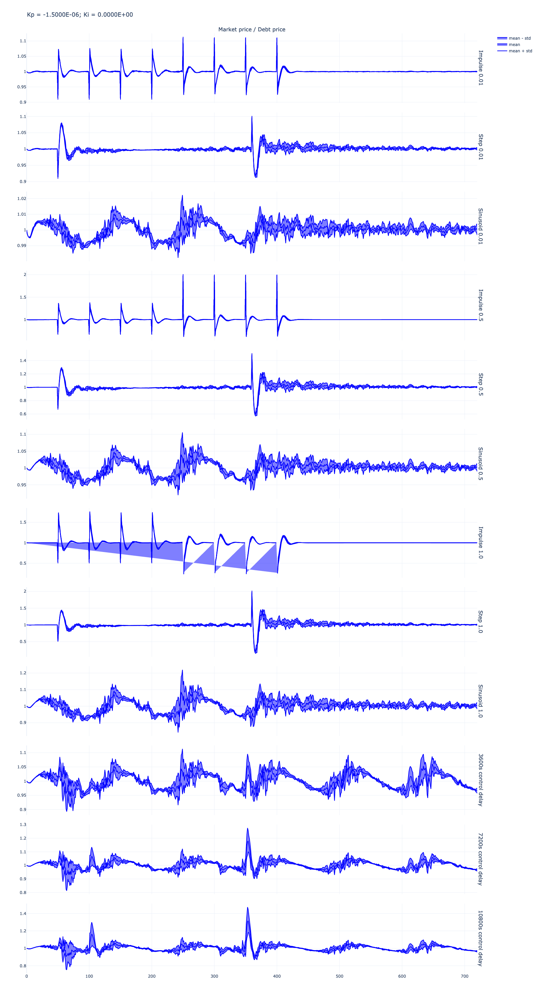

In [14]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

rows = len(shocks)

fig = make_subplots(
    rows=rows,
    cols=1,
    shared_xaxes=True,
    shared_yaxes="rows",
    horizontal_spacing=0.01,
    vertical_spacing=0.01,
    column_titles=[
        "Market price / Debt price"
    ],
    row_titles=[
        "Impulse 0.01",
        "Step 0.01",
        "Sinusoid 0.01",
        "Impulse 0.5",
        "Step 0.5",
        "Sinusoid 0.5",
        "Impulse 1.0",
        "Step 1.0",
        "Sinusoid 1.0",
        "3600s control delay",
        "7200s control delay",
        "10800s control delay",
    ],
    specs=[
        [
            {"type": "xy"},
        ]
        for _ in range(rows)
    ],
)

for subset in range(df.subset.max() + 1):
    dataset = df[df.subset == subset]

    dataset["relative_diff"] = df.market_price / df.debt_price
    
    overshoot_pct = (dataset.market_price.max() - dataset.debt_price.max()) / dataset.debt_price.max() * 100

    reasonable_steady_state_error = 0.01
    dataset["pct_error"] = dataset["error_hat"] / dataset["debt_price"]
    dataset["pct_error"] = dataset["pct_error"].abs()
    recovery_metric = (
        dataset[dataset.pct_error > reasonable_steady_state_error]
        .groupby(["run"])["timedelta"]
        .sum()
        .mean()
        / 3600
    )

    timesteps = dataset.timestep
    grouped = dataset.groupby("timestep", as_index=False)
    mean = grouped.mean()
    std = grouped.std()

    row = subset + 1
    show_legend = subset == 0

    col = 1
    fig.add_trace(
        go.Scatter(
            x=timesteps,
            y=mean["relative_diff"] + std["relative_diff"],
            name="mean + std",
            mode="lines",
            line_color="blue",
            showlegend=show_legend,
        ),
        row=row,
        col=col,
    )
    fig.add_trace(
        go.Scatter(
            x=timesteps,
            y=mean["relative_diff"],
            name="mean",
            fill="tonexty",
            mode="lines",
            line_color="blue",
            showlegend=show_legend,
        ),
        row=row,
        col=col,
    )
    fig.add_trace(
        go.Scatter(
            x=timesteps,
            y=mean["relative_diff"] - std["relative_diff"],
            name="mean - std",
            fill="tonexty",
            mode="lines",
            line_color="blue",
            showlegend=show_legend,
        ),
        row=row,
        col=col,
    )

fig.update_layout(
    title=f'Kp = {"{:.4E}".format(kp)}; Ki = {"{:.4E}".format(ki)}',
    height=3000,
    template="plotly_white",
)
fig.show()
fig.write_image(
    f'exports/shock_std/kp_{"{:.4E}".format(kp)}-ki_{"{:.4E}".format(ki)}.png',
    width="1800",
)
fig.write_html(
    f'exports/shock_std/kp_{"{:.4E}".format(kp)}-ki_{"{:.4E}".format(ki)}.html'
)